<a href="https://colab.research.google.com/github/rodolphoya/dscbc_2021_01-fakenews/blob/main/programas/Moxu/fato_ou_fake.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Todos os arquivos e bibliotecas para o projeto
!wget https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/dados_e_datasets/datasets/novos_dados.csv
!wget https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/dados_e_datasets/dados/stopwords-pt.txt
!wget https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/dados_e_datasets/datasets/fato_ou_fake.csv
!wget https://www.thedoctorstv.com/sites/default/files/styles/969x546/public/images/2020-04/medical_mask_0.jpg?h=d1cb525d
!wget https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/programas/Moxu/functions.py
!wget https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/dados_e_datasets/datasets/fato_ou_fake_lem.csv

from functions import ProjectFunctions # funções específicas do projeto
# Para analisar as predições
try:
    from lime import lime_text
except:
    !pip install lime
    from lime import lime_text

# Manipulação de números
import numpy as np
#from os import path

# Limpeza
import re
import unicodedata

# Visualização
from matplotlib import pyplot as plt
import pandas as pd
from PIL import Image
import seaborn as sns
from wordcloud import WordCloud, ImageColorGenerator
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.model_selection import LearningCurve
from yellowbrick.text import FreqDistVisualizer, TSNEVisualizer

# Machine Learning, vetorização e métricas
import nltk
from nltk import FreqDist
import sklearn
from sklearn.calibration import calibration_curve
from sklearn import naive_bayes, pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegressionCV
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from xgboost import XGBClassifier

# Lista de stopwords
stop_port = list(open(r'/content/stopwords-pt.txt'))
stop_port = [i.replace('\n','') for i in stop_port]

# Remove acentos das stop_words
stop_port = [ProjectFunctions.remover_acentos_e_numeros(i) for i in stop_port]

--2021-06-08 21:29:10--  https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/dados_e_datasets/datasets/novos_dados.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40092 (39K) [text/plain]
Saving to: ‘novos_dados.csv’

novos_dados.csv     100%[===================>]  39.15K  --.-KB/s    in 0.007s  

2021-06-08 21:29:11 (5.80 MB/s) - ‘novos_dados.csv’ saved [40092/40092]

--2021-06-08 21:29:11--  https://raw.githubusercontent.com/rodolphoya/dscbc_2021_01-fakenews/main/dados_e_datasets/dados/stopwords-pt.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP req

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


     |████████████████████████████████| 276kB 3.8MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283858 sha256=29110cc7f1b2b734add78c3e67862ec452c72290e03722573f1a20793afb7365
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


#Pré-processamento

In [ ]:
df = pd.read_csv('/content/fato_ou_fake.csv')

Vamos fazer as primeiras visualizações do nosso dataset e começar a fase de pré-processamento.

In [ ]:
df.isnull().sum()

url        0
titulo     0
noticia    0
classe     0
dtype: int64

In [ ]:
# Removendo as sujeiras dos títulos e das notícias
df.noticia = df.noticia.apply(ProjectFunctions.remover_acentos_e_numeros)
df.titulo = df.titulo.apply(ProjectFunctions.remover_acentos_e_numeros)

In [ ]:
df.classe.value_counts()

VERDADEIRO    3263
FALSO         2224
Name: classe, dtype: int64

In [ ]:
# Transformando a variável alvo em categórica
df.classe = df.classe.astype('category')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5487 entries, 0 to 5486
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   url      5487 non-null   object  
 1   titulo   5487 non-null   object  
 2   noticia  5487 non-null   object  
 3   classe   5487 non-null   category
dtypes: category(1), object(3)
memory usage: 134.2+ KB


Podemos visualizar como o conteúdo de notícias verdadeiras e não-verdadeiras se relacionam uuma com a outra. Enquanto podemos ver alguns pontos de encontro entre ambas, é claro como elas se distanciam. Um olhar mais especial para as notícias verdadeiras revelará alguns agrupamentos importantes dentro do campo das notícias falsas. O que vamos interpretar daí é uma consistência de temas maior entre as notícias falsas do que entre as notícias verdadeiras.

# Visualizações

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


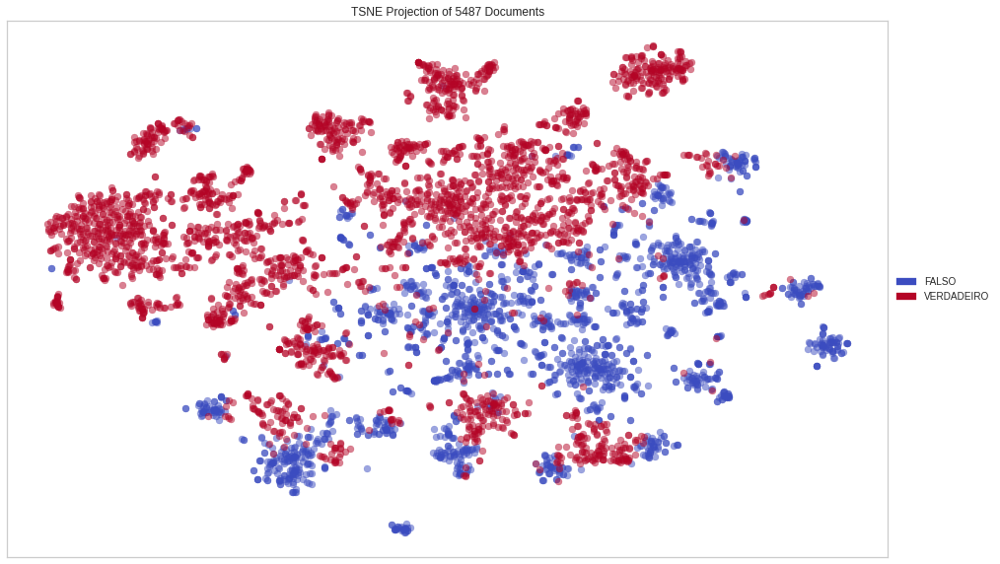

In [ ]:
# Relacionamento do conteúdo das notícias
tfidf = TfidfVectorizer(stop_words=stop_port)

X = tfidf.fit_transform(df.noticia)
y = df.classe

plt.figure(figsize=(20, 10))
tsne = TSNEVisualizer(colormap='coolwarm', 
                      colors=('blue','red'),

                      alpha=0.5)
tsne.fit(X, y)
tsne.poof()

#### Notícias verdadeiras

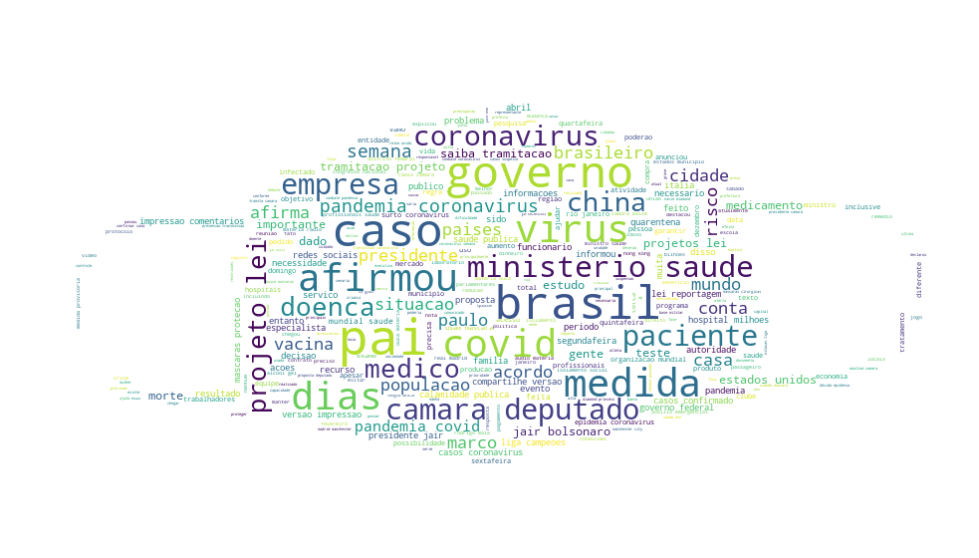

In [ ]:
ProjectFunctions.plot_cloud(
    df.loc[df.classe == 'VERDADEIRO'],
    stop_port,
    np.array(Image.open('/content/medical_mask_0.jpg?h=d1cb525d')))

#### Notícias falsas

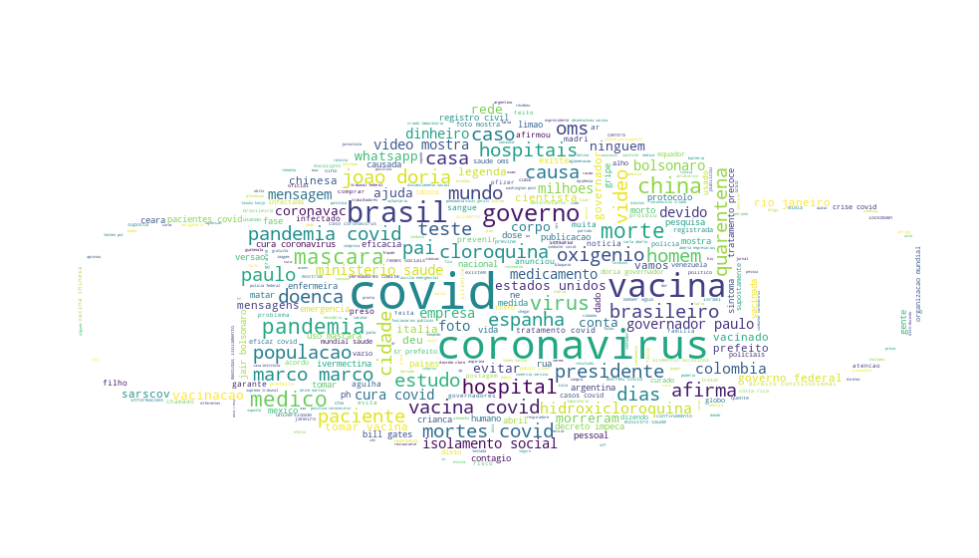

In [ ]:
ProjectFunctions.plot_cloud(df.loc[df.classe == 'FALSO'],
    stop_port,
    np.array(Image.open('/content/medical_mask_0.jpg?h=d1cb525d')))

### Frequência de palavras

#### Notícias verdadeiras

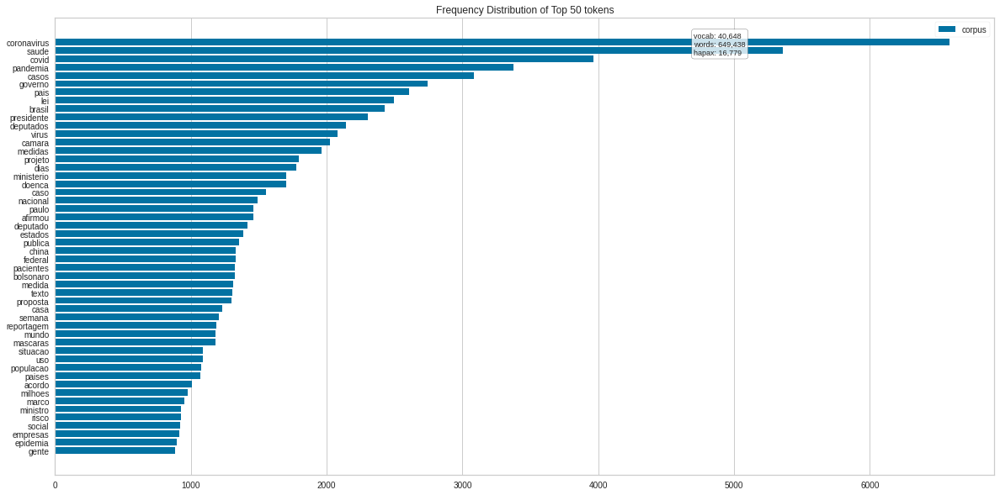

In [ ]:
ProjectFunctions.freq_visualiser(df.loc[df.classe == 'VERDADEIRO'],
                                 stop_port)

#### Notícias falsas

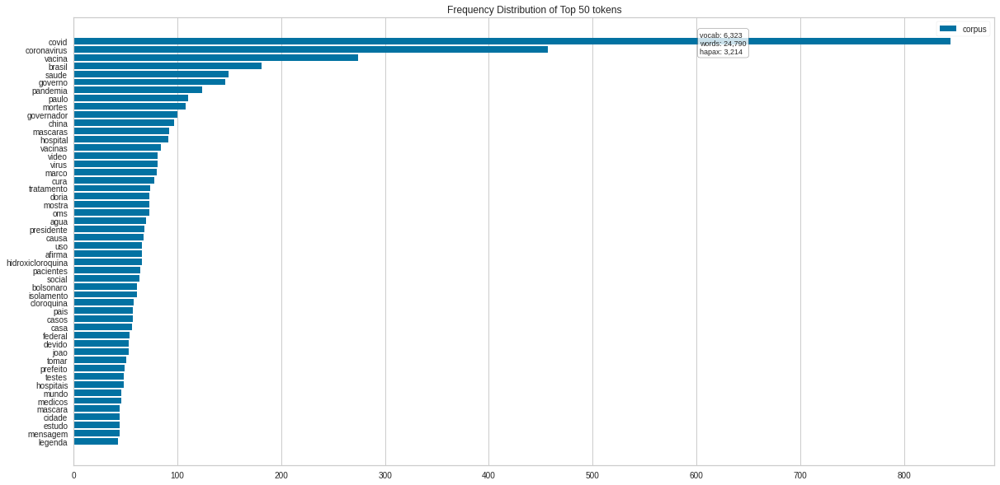

In [ ]:
ProjectFunctions.freq_visualiser(df.loc[df.classe == 'FALSO'],
                stop_port)

# Modelagem

Para um baseline de modelagem, vamos utilizar dois métodos de vetorização de textos. O tradicional bag of words, e um mais complexo chamado TF-IDF. Simplificando, o bag of words vetoriza um elemento do texto através de sua frequência. O TF-IDF tem um caráter mais penalizador. Isto é, ele vetoriza elementos do texto através do seu peso. Quanto menor sua frequência, maior seu peso. Quanto maior sua frequência, menor seu peso. O algoritmo que vamos utilizar aqui será de Regressão Logística.

Vamos treinar e testar nosso modelo nos dados e comparar as métricas para ver qual método apresenta o melhor desempenho.

In [ ]:
X = df.noticia
y = df.classe

# Repartindo o dataset em teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.33,
                                                    random_state=123)

#### Treinando e testando o modelo com o CountVectorizer

In [ ]:
## pipeline para o count
model_count = pipeline.Pipeline([("vectorizer", CountVectorizer(stop_words=stop_port)),  
                           ("classifier", LogisticRegressionCV(cv=3))])

In [ ]:
# Vetorizando os datasets
train = model_count['vectorizer'].fit_transform(X_train)
test = model_count['vectorizer'].transform(X_test)

# Treinando e testando
model_count['classifier'].fit(train, y_train)
pred = model_count['classifier'].predict(test)
prob_count = model_count['classifier'].predict_proba(test)

In [ ]:
# Métricas
print(metrics.classification_report(y_test, pred, digits=3))
print('\n\n A matriz de confusão das nossas predições é de: \n {} \n\n'.format(metrics.confusion_matrix(y_test, pred)))

              precision    recall  f1-score   support

       FALSO      0.974     0.997     0.985       715
  VERDADEIRO      0.998     0.983     0.990      1096

    accuracy                          0.988      1811
   macro avg      0.986     0.990     0.988      1811
weighted avg      0.989     0.988     0.988      1811



 A matriz de confusão das nossas predições é de: 
 [[ 713    2]
 [  19 1077]] 




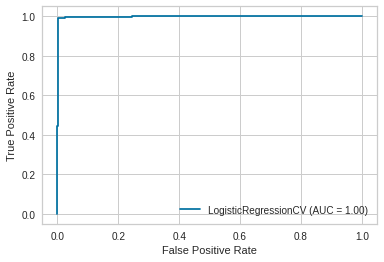

In [ ]:
# Plotando a curva ROC
print(metrics.plot_roc_curve(model_count['classifier'], test, y_test))

Nota-se algumas perturbações em alguns pontos. Talvez possamos interpretar como um aumento da dificuldade do modelo de aprender.

Com essa visualização podemos observar melhor que os erros foram insignificantes em relação aos acertos.

Como saberemos se, através da divisão feita, os dados de treino receberam dados comprometedores para o modelo. Vamos usar a técnica de cross-validation K-Fold, que consiste em dividir o dataset em k partes e testar o modelo em diferentes partes do dataset.

In [ ]:
# Transformando os valores VERDADEIRO e FALSO em 1 e 0
y_num = y.replace(['FALSO', 'VERDADEIRO'], [0, 1]).astype('category')
# Método para validação cruzada
cv = KFold(n_splits=10, random_state=123, shuffle=True)

print(f"A acurácia do cross validation no CountVectorizer é de {np.mean(cross_val_score(model_count, X, y_num, cv=cv, scoring='accuracy', n_jobs=-1))}.")

A acurácia do cross validation no CountVectorizer é de 0.989975469666148.


Com essa validação temos uma segurança maior do nível de variância do modelo.

Mas, quais foram as palavras mais decisivas para que o nosso modelo escolhesse entre ser uma notícia falsa e uma notícia verdadeira? Vamos olhar como cada método influenciou na tomada de decisão do modelo.

In [ ]:
# Palavras mais decisivas de todo o dataset
ProjectFunctions.show_most_informative_features(model_count['vectorizer'], model_count['classifier'])

	-1.2348	pronta         		6.8931	gabriel        
	-0.8470	mascaras       		6.8814	priscila       
	-0.8430	governador     		6.8814	mengue         
	-0.7800	vacina         		6.8712	caldeira       
	-0.7033	espanha        		2.9200	avalia         
	-0.6972	isolamento     		2.9165	moro           
	-0.6935	mortes         		2.8365	fronteira      
	-0.6146	conteudos      		2.6615	redes          
	-0.6104	suposta        		2.5170	publicacoes    
	-0.6102	ligadas        		2.4997	sociais        
	-0.5987	vamos          		2.4648	fechar         
	-0.5592	cura           		2.3813	paises         
	-0.5330	municipio      		2.3034	compartilhadas 
	-0.5328	gente          		2.1934	anunciou       
	-0.5098	corpo          		2.0350	afp            
	-0.5026	governadores   		1.9836	coronavirus    
	-0.4954	garantem       		1.8971	microbiologia  
	-0.4868	fraude         		1.8971	iamarino       
	-0.4866	colombia       		1.8971	atila          
	-0.4784	sobreviveu     		1.8637	biologo        


Vamos olhar para os três primeiros features de cada coluna. As palavras "pronta", "mascaras" e "governador" foram as mais importantes para que o modelo as classificasse como falsas. Importante observar que "gabriel", "priscila" e "mengue" foram as mais significativas para serem classificadas como verdadeiras, o que para o tema não tem nenhuma significância real.

No entanto, há algumas coisas mais interessantes. Na parte das notícias falsas, palavras como "isolamento", "cura", "fraude" e "sobreviveu" saltam aos olhos. Na parte das notícias verdadeiras, as palavras "redes", "publicacoes", "sociais". Uma questão interessante é observar as últimas 4 features, com valores iguais ou próximos, e ao mesmo tempo relacionáveis: "microbiologia", "atila", "iamarino" e "biologo".

In [ ]:
# Retirando a maior probabilidade das predições
prob_for_count = []
for i in model_count.predict_proba(X_test):
    prob_for_count.append(np.max(i))

pred_for_count = model_count.predict(X_test)

In [ ]:
# Criação de uma tabela com todas as predições
predict_count = pd.Series(pred_for_count, name='predicao')
probab_count = pd.Series(prob_for_count, name='probabilidade')

performance_count = pd.concat([X_test.reset_index(drop=True), y_test.reset_index(drop=True), 
                         predict_count, probab_count], axis=1, ignore_index=False)

In [ ]:
# Buscando as predições incorretas
performance_count.loc[performance_count.classe != performance_count.predicao]

,noticia,classe,predicao,probabilidade
104,prestem atencao nas datas das vacinas para os ...,FALSO,VERDADEIRO,1.000000
126,um meme compartilhado mais de mil vezes nas re...,VERDADEIRO,FALSO,0.557029
166,chorei porque estou com saudade do meu filho e...,VERDADEIRO,FALSO,0.998955
209,no boletim coronavirus desta sexta o infectolo...,VERDADEIRO,FALSO,0.996940
216,skincare disse a esposa da cantora na legenda ...,VERDADEIRO,FALSO,0.935310
253,calca dimensional entre os filmes estao cinder...,VERDADEIRO,FALSO,0.999385
257,publicacoes que circulam no facebook pelo meno...,VERDADEIRO,FALSO,0.915570
296,de acordo com informacoes obtidas pela reporta...,VERDADEIRO,FALSO,0.651961
336,bolsonaro e guedes se atrapalham com mascaras ...,VERDADEIRO,FALSO,0.999980
392,integrantes do governo federal citaram o que c...,VERDADEIRO,FALSO,0.994029


In [ ]:
def predict_explainer_for_training(index, model_pipeline, X_test, y_test, y_train, predict, predict_probability):
    # Mostra como foi a tomada de decisão para cada notícia classificada pelo
    # modelo. A função recebe o index de uma notícia, o pipeline do modelo,
    # as predições e as probabilidades das predições.

    y_test.reset_index(drop=True, inplace=True)
    X_test.reset_index(drop=True, inplace=True)

    # Selecionando a notícia
    i = index
    txt_instance = X_test[i]

    # Comparando a categoria real com a predição
    print("Categoria:", y_test[i], 
        "--> Predição:", predict[i],
        "| Probabilidade:", round((np.max(predict_probability[i])*100), 6), "%")
    
    # Mostrando a explicação do modelo
    explainer = lime_text.LimeTextExplainer(class_names=
                np.unique(y_train))
    explained = explainer.explain_instance(txt_instance, 
                model_pipeline.predict_proba, num_features=10)
    explained.show_in_notebook(text=txt_instance, predict_proba=False)

def predict_explainer_for_test(index, model_pipeline, predict, predict_probability, X, y):
    y.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Selecionando a notícia
    i = index
    txt_instance = X[i]

    # Comparando a categoria real com a predição
    print("Categoria:", y[i],
        "Predição:", predict[i],
        "| Probabilidade:", round((np.max(predict_probability[i])*100), 6), "%")
    
    # Mostrando a explicação do modelo
    explainer = lime_text.LimeTextExplainer(class_names=
                np.unique(y))
    explained = explainer.explain_instance(txt_instance, 
                model_pipeline.predict_proba, num_features=15)
    explained.show_in_notebook(text=txt_instance, predict_proba=False)

In [ ]:
predict_explainer_for_training(1200, model_count, X_test, y_test, y_train, pred_for_count, prob_for_count)

Categoria: VERDADEIRO --> Predição: FALSO | Probabilidade: 78.967018 %


#### Treinando e testando o modelo com o TF-IDF

In [ ]:
## Pipeline contendo o modelo e o vetorizador para TF-IDF
model_tf = pipeline.Pipeline([("vectorizer", TfidfVectorizer(stop_words=stop_port)),  
                           ("classifier", LogisticRegressionCV(cv=3))])

In [ ]:
# Vetorizando os datasets
train_tf = model_tf['vectorizer'].fit_transform(X_train)
test_tf = model_tf['vectorizer'].transform(X_test)

# Treinando e testando
model_tf['classifier'].fit(train_tf, y_train)
pred_tf = model_tf['classifier'].predict(test_tf)

# Probabilidade das predições
pred_prob = model_tf['classifier'].predict_proba(test_tf)

In [ ]:
# Métricas do modelo no método TF-IDF
print(metrics.classification_report(y_test, pred_tf, digits=3))
print('\n\n A matriz de confusão das nossas predições é de: \n {} \n\n'.format(metrics.confusion_matrix(y_test, pred_tf)))

              precision    recall  f1-score   support

       FALSO      0.983     0.989     0.986       715
  VERDADEIRO      0.993     0.989     0.991      1096

    accuracy                          0.989      1811
   macro avg      0.988     0.989     0.988      1811
weighted avg      0.989     0.989     0.989      1811



 A matriz de confusão das nossas predições é de: 
 [[ 707    8]
 [  12 1084]] 




A média de acertos do modelo vetorizado por TF-IDF é de 99%, sendo 98% de todas as notícias falsas preditas como falsas e 99% de todas as notícias verdadeiras preditas como verdadeiras foram predições corretas. 99% de ambos os tipos foram preditos corretamente.

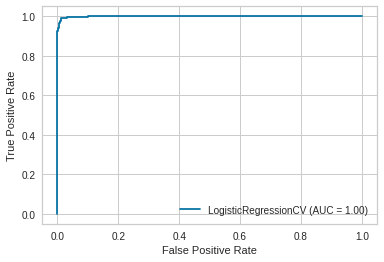

In [ ]:
print(metrics.plot_roc_curve(model_tf['classifier'], test_tf, y_test))

Nota-se uma perturbação maior na ponta esquerda.

Vamos rodar uma validação cruzada também para checar os resultados.

In [ ]:
print(f"A acurácia do cross validation no TF-IDF é de {np.mean(cross_val_score(model_tf, X, y_num, cv=cv, scoring='accuracy', n_jobs=-1))}.")

A acurácia do cross validation no TF-IDF é de 0.9856002286838711.


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


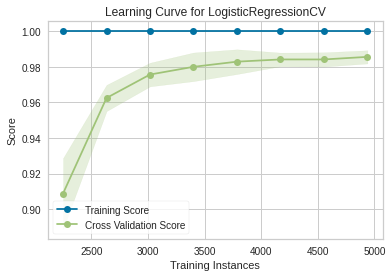

In [ ]:
ProjectFunctions.learning_curve(model_tf, X, y)

In [ ]:
# Features mais importantes no TF-IDF
ProjectFunctions.show_most_informative_features(model_tf['vectorizer'], model_tf['classifier'])

	-6.2137	covid          		7.9365	sociais        
	-3.0984	descartou      		7.1984	redes          
	-2.9759	colombia       		6.1503	informou       
	-2.7707	oms            		5.8073	pais           
	-2.7698	vacina         		5.8068	afirmou        
	-2.5548	espanha        		5.5861	fake           
	-2.5511	mascaras       		5.5218	deputados      
	-2.4240	pronta         		5.4327	semana         
	-2.4195	legenda        		5.4302	lei            
	-2.1886	pcr            		5.3324	compartilhadas 
	-2.1362	israel         		5.2436	medida         
	-2.1057	ivermectina    		5.1058	saude          
	-2.0085	equador        		5.0410	proposta       
	-1.9975	hipoxia        		5.0273	entanto        
	-1.9819	prejudiciais   		4.9384	epidemia       
	-1.9707	mostra         		4.8653	acordo         
	-1.9683	mortes         		4.7855	doenca         
	-1.9173	mensagens      		4.6884	virus          
	-1.8981	desinfetante   		4.6677	reportagem     
	-1.8816	expulsos       		4.5875	atualizado     


In [ ]:
# Retirando a maior probabilidade das predições
proba_tf = []
for i in model_tf.predict_proba(X_test):
    proba_tf.append(np.max(i))

pred_tf = model_tf.predict(X_test)

In [ ]:
# Criação de uma tabela com todas as predições
predict_tf = pd.Series(pred_tf, name='predicao')
probab_tf = pd.Series(proba_tf, name='probabilidade')

performance = pd.concat([X_test.reset_index(drop=True), y_test.reset_index(drop=True), 
                         predict_tf, probab_tf], axis=1, ignore_index=False)

In [ ]:
# Buscando as predições incorretas
performance.loc[performance.classe != performance.predicao]

,noticia,classe,predicao,probabilidade
74,rodrigo maia presidente da camara dos deputado...,FALSO,VERDADEIRO,0.758560
104,prestem atencao nas datas das vacinas para os ...,FALSO,VERDADEIRO,0.624999
208,o centro de controle de doencas do governo dos...,FALSO,VERDADEIRO,0.815329
209,no boletim coronavirus desta sexta o infectolo...,VERDADEIRO,FALSO,0.833588
253,calca dimensional entre os filmes estao cinder...,VERDADEIRO,FALSO,0.785617
257,publicacoes que circulam no facebook pelo meno...,VERDADEIRO,FALSO,0.736128
336,bolsonaro e guedes se atrapalham com mascaras ...,VERDADEIRO,FALSO,0.947741
392,integrantes do governo federal citaram o que c...,VERDADEIRO,FALSO,0.846947
525,redes sociais asseguram que a gerente legal da...,FALSO,VERDADEIRO,0.755206
638,em transmissao ao vivo feita no ultimo dia de ...,VERDADEIRO,FALSO,0.682653


In [ ]:
predict_explainer_for_training(874, model_tf, X_test, y_test, y_train, pred_tf, pred_prob,)

Categoria: FALSO --> Predição: VERDADEIRO | Probabilidade: 62.553312 %


##Outros modelos

#### Random Forest

In [ ]:
model_random = pipeline.Pipeline([("vectorizer", 
                                   TfidfVectorizer(stop_words=stop_port, 
                                                   ngram_range=(1,2),
                                                   min_df= 0.01)),  
                                  ("classifier", 
                            RandomForestClassifier(random_state=123,
                                                                 n_jobs=-1))])

In [ ]:
# Vetorizando os datasets
train_tf_r = model_random['vectorizer'].fit_transform(X_train)
test_tf_r = model_random['vectorizer'].transform(X_test)

# Treinando e testando
model_random['classifier'].fit(train_tf_r, y_train)
pred_tf_r = model_random['classifier'].predict(test_tf_r)

# Probabilidade das predições
pred_prob_r = model_random['classifier'].predict_proba(test_tf_r)

In [ ]:
print(metrics.classification_report(y_test, pred_tf_r, digits=3))
print('\n\n A matriz de confusão das nossas predições é de: \n {} \n\n'.format(metrics.confusion_matrix(y_test, pred_tf_r)))

              precision    recall  f1-score   support

       FALSO      0.969     0.999     0.983       715
  VERDADEIRO      0.999     0.979     0.989      1096

    accuracy                          0.987      1811
   macro avg      0.984     0.989     0.986      1811
weighted avg      0.987     0.987     0.987      1811



 A matriz de confusão das nossas predições é de: 
 [[ 714    1]
 [  23 1073]] 




In [ ]:
ProjectFunctions.learning_curve(model_random, X, y)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


#### XGBOOST Classifier

In [ ]:
model_xgboost = pipeline.Pipeline([("vectorizer", 
                                   TfidfVectorizer(stop_words=stop_port, 
                                                   ngram_range=(1,2),
                                                   max_df= 0.85, min_df= 0.01)),  
                                  ("classifier", XGBClassifier(max_depth=7,
                                                               random_state=123))])

In [ ]:
# Vetorizando os datasets
train_tf_x = model_xgboost['vectorizer'].fit_transform(X_train)
test_tf_x = model_xgboost['vectorizer'].transform(X_test)

# Treinando e testando
model_xgboost['classifier'].fit(train_tf_x, y_train)
pred_tf_x = model_xgboost['classifier'].predict(test_tf_x)

# Probabilidade das predições
pred_prob_x = model_xgboost['classifier'].predict_proba(test_tf_x)

In [ ]:
print(metrics.classification_report(y_test, pred_tf_x, digits=3))
print('\n\n A matriz de confusão das nossas predições é de: \n {} \n\n'.format(metrics.confusion_matrix(y_test, pred_tf_x)))

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


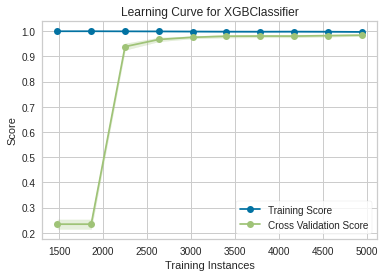

In [ ]:
ProjectFunctions.learning_curve(model_xgboost, X, y)

## Comparando os três modelos visualmente

O RandomForest é bem consistente, independente do tamanho do dataset. Ele tem a melhor curva de aprendizado.

Como podemos ver, o modelo com maior acurácia e menor tempo de ajuste e bem consistente, em comparação aos outros é o **RandomForest**.

##Testagem com Novos Dados

Como nossos modelos reagirão aos novos dados? Vamos observar.

In [ ]:
testagem = pd.read_csv('/content/novos_dados.csv')

Vamos limpar os dados e jogar para os modelos preverem.

In [ ]:
# Limpando os titulos e os textos
testagem.titulos = testagem.titulos.apply(ProjectFunctions.remover_acentos_e_numeros)
testagem.textos = testagem.textos.apply(ProjectFunctions.remover_acentos_e_numeros)

# Categorizando as noticias
testagem['classe_original'] = None
testagem.classe_original[:14] = 'FALSO'
testagem.classe_original[14:] = 'VERDADEIRO'

#### LogisticRegression

In [ ]:
pred_real = model_tf.predict(testagem.textos)
prob_real = model_tf.predict_proba(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_real, digits=3))

              precision    recall  f1-score   support

       FALSO      0.812     0.929     0.867        14
  VERDADEIRO      0.889     0.727     0.800        11

    accuracy                          0.840        25
   macro avg      0.851     0.828     0.833        25
weighted avg      0.846     0.840     0.837        25



In [ ]:
metrics.confusion_matrix(testagem.classe_original, pred_real)

array([[13,  1],
       [ 3,  8]])

In [ ]:
predict_explainer_for_test(11, model_tf, pred_real, prob_real, 
                       testagem.textos, testagem.classe_original)

Categoria: FALSO Predição: FALSO | Probabilidade: 91.18385 %


#### RandomForestClassifier

In [ ]:
pred_random = model_random.predict(testagem.textos)
prob_random = model_random.predict(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_random, digits=3))

              precision    recall  f1-score   support

       FALSO      0.875     1.000     0.933        14
  VERDADEIRO      1.000     0.818     0.900        11

    accuracy                          0.920        25
   macro avg      0.938     0.909     0.917        25
weighted avg      0.930     0.920     0.919        25



In [ ]:
metrics.confusion_matrix(testagem.classe_original, pred_random)

array([[14,  0],
       [ 2,  9]])

#### XGBOOSTClassifier

In [ ]:
pred_xg = model_xgboost.predict(testagem.textos)
prob_xg = model_xgboost.predict(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_xg, digits=3))

              precision    recall  f1-score   support

       FALSO      0.800     0.857     0.828        14
  VERDADEIRO      0.800     0.727     0.762        11

    accuracy                          0.800        25
   macro avg      0.800     0.792     0.795        25
weighted avg      0.800     0.800     0.799        25



In [ ]:
metrics.confusion_matrix(testagem.classe_original, pred_xg)

array([[12,  2],
       [ 3,  8]])

# Pós-Processamento

##Lematização

In [ ]:
!pip install -U spacy
!pip install -U spacy-lookups-data
!python -m spacy download pt_core_news_lg
import spacy

     |████████████████████████████████| 12.8MB 27.5MB/s 
     |████████████████████████████████| 9.1MB 36.6MB/s 
     |████████████████████████████████| 1.1MB 41.9MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 460kB 39.5MB/s 
     |████████████████████████████████| 122kB 46.0MB/s 
  Created wheel for smart-open: filename=smart_open-3.0.0-cp37-none-any.whl size=107107 sha256=8e06cbef93cb8c9cd4b6cb507d17aeabfa27b124e14c2f023ee22d626bf6402d
  Stored in directory: /root/.cache/pip/wheels/18/88/7c/f06dabd5e9cabe02d2269167bcacbbf9b47d0c0ff7d6ebcb78
Successfully built smart-open
  Found existing installation: catalogue 1.0.0
    Uninstalling catalogue-1.0.0:
      Successfully uninstalled catalogue-1.0.0
  Found existing installation: srsly 1.0.5
    Uninstalling srsly-1.0.5:
      Successfully uninstalled srsly-1.0.5
  Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Found 

In [ ]:
texto = ""
nlp = spacy.load("pt_core_news_lg")
doc = nlp(texto)

df = pd.read_csv('fato_ou_fake.csv', encoding = 'utf-8')

lematizado = []
for texto in df.noticia:
    doc = nlp(texto) 
    lemat = [token.lemma_ for token in doc]
    #print(lemat)
    lematizado.append(lemat)

df['noticia_lem'] = lematizado

A partir dos nosso resultados, podemos chegar a conclusão que o modelo possa estar utilizando do tamanho de cada notícia como um critério de predição, visto que em relação a tamanho de caracteres, os textos são extremamente imbalanceados. Além disso, vamos entender a importância de determinadas palavras nas notícias que o modelo errou, mesmo com uma alta probabilidade de predição.

## Entendimento e novos testes

In [ ]:
df_lem = pd.read_csv('/content/fato_ou_fake_lem.csv', index_col='Unnamed: 0')

In [ ]:
df_lem.noticia_lem = df_lem.noticia_lem.apply(ProjectFunctions.remover_acentos_e_numeros)

In [ ]:
X_pos = df_lem.noticia_lem
y_pos = df_lem.classe

# Repartindo o dataset em teste e treino
X_train_pos, X_test_pos, y_train_pos, y_test_pos = train_test_split(X_pos, y_pos, 
                                                    test_size=0.33,
                                                    random_state=123)

In [ ]:
pos_modeling = pipeline.Pipeline([('vectorizer', TfidfVectorizer(stop_words=stop_port)),
                                  ('classifier', LogisticRegressionCV(cv=3,
                                                                      random_state=123,
                                                                      max_iter=1000))])

In [ ]:
# retirando notícias com menos de 100 caracteres e truncando notícias com mais
# de 300 caracteres
X_train_pos = X_train_pos.apply(lambda x: np.nan if len(x) < 100 
                                         else x[:300])

train = pd.concat([X_train_pos, y_train_pos], axis=1)
train.dropna(axis=0, inplace=True)

In [ ]:
# Vetorizando os datasets
train_pos = pos_modeling['vectorizer'].fit_transform(train.noticia_lem)
test_pos = pos_modeling['vectorizer'].transform(X_test_pos)

# Treinando e testando
pos_modeling['classifier'].fit(train_pos, train.classe)
pred_tf_p = pos_modeling['classifier'].predict(test_pos)

# Probabilidade das predições
pred_prob_p = pos_modeling['classifier'].predict_proba(test_pos)

In [ ]:
print(metrics.classification_report(y_test_pos, pred_tf_p, digits=3))
print('\n\n A matriz de confusão das nossas predições é de: \n {} \n\n'.format(metrics.confusion_matrix(y_test_pos, pred_tf_p)))

              precision    recall  f1-score   support

       FALSO      0.995     0.776     0.872       715
  VERDADEIRO      0.872     0.997     0.931      1096

    accuracy                          0.910      1811
   macro avg      0.933     0.887     0.901      1811
weighted avg      0.921     0.910     0.907      1811



 A matriz de confusão das nossas predições é de: 
 [[ 555  160]
 [   3 1093]] 




/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


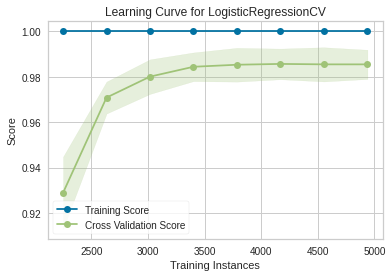

In [ ]:
ProjectFunctions.learning_curve(pos_modeling, X_pos, y_pos)

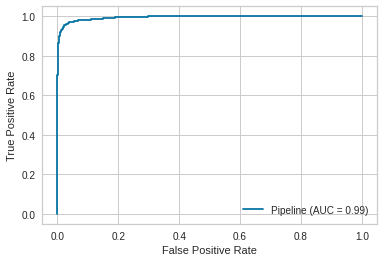

In [ ]:
metrics.plot_roc_curve(pos_modeling, X_test_pos, y_test_pos)

In [ ]:
ProjectFunctions.show_most_informative_features(pos_modeling['vectorizer'],
                               pos_modeling['classifier'])

	-20.2329	covid          		16.3952	atualizado     
	-15.7525	vacina         		15.9113	rede           
	-12.5214	espanha        		14.1686	compartilhar   
	-11.9723	legendar       		13.9731	circular       
	-11.2211	governador     		12.6870	deputar        
	-11.0400	mascara        		11.9360	ultima         
	-10.8065	diminuir       		11.5062	entanto        
	-10.3653	curar          		11.4915	domingo        
	-10.1393	espanhol       		10.6603	anunciar       
	-9.5488	cachorro       		10.5706	fake           
	-9.1635	madri          		10.3990	falecer        
	-9.1210	doar           		10.3383	sextafeira     
	-9.0266	descartar      		10.3120	tercafeira     
	-8.9206	empresaios     		10.2346	caso           
	-8.8213	colombia       		10.0864	segundar       
	-8.6871	afirmacoes     		9.8313	quartafeira    
	-8.4540	saque          		9.7224	vezar          
	-8.4457	respirador     		9.6491	riscar         
	-8.4361	sexual         		9.6346	evento         
	-8.2391	oms            		9.4140	comentar    

In [ ]:
predict_explainer_for_training(875, pos_modeling, X_test_pos, y_test_pos, 
                  y_train_pos, pred_tf_p, pred_prob_p)

Categoria: VERDADEIRO --> Predição: VERDADEIRO | Probabilidade: 99.999998 %


Vamos fazer mais uma modificação nos dados e ver mais resultados.

In [ ]:
pos_modeling_2 = pipeline.Pipeline([('vectorizer', TfidfVectorizer(stop_words=stop_port)),
                                  ('classifier', LogisticRegressionCV(cv=3,
                                                                      random_state=123,
                                                                      max_iter=1000))])

In [ ]:
X_2 = df_lem.noticia_lem
y_2 = df_lem.classe

# Repartindo o dataset em teste e treino
X_train_pos_2, X_test_pos_2, y_train_pos_2, y_test_pos_2 = train_test_split(X_2, y_2, 
                                                    test_size=0.33,
                                                    random_state=123)

In [ ]:
# Retirando notícias com menos de 70 caracteres e truncando notícias
# com mais de 200 caracteres nos textos de treino
X_train_pos_2 = X_train_pos_2.apply(lambda x: np.nan if len(x) < 70 
                                         else x[:200])

train_2 = pd.concat([X_train_pos_2, y_train_pos_2], axis=1)
train_2.dropna(axis=0, inplace=True)

In [ ]:
# Vetorizando os datasets
train_pos_2 = pos_modeling_2['vectorizer'].fit_transform(train_2.noticia_lem)
test_pos_2 = pos_modeling_2['vectorizer'].transform(X_test_pos_2)

# Treinando e testando
pos_modeling_2['classifier'].fit(train_pos_2, train_2.classe)
pred_tf_p_2 = pos_modeling_2['classifier'].predict(test_pos_2)

# Probabilidade das predições
pred_prob_p_2 = pos_modeling_2['classifier'].predict_proba(test_pos_2)

In [ ]:
print(metrics.classification_report(y_test_pos_2, pred_tf_p_2, digits=3))
print('\n\n A matriz de confusão das nossas predições é de: \n {} \n\n'.format(metrics.confusion_matrix(y_test_pos_2, pred_tf_p_2)))

              precision    recall  f1-score   support

       FALSO      0.966     0.841     0.899       715
  VERDADEIRO      0.904     0.981     0.941      1096

    accuracy                          0.925      1811
   macro avg      0.935     0.911     0.920      1811
weighted avg      0.929     0.925     0.924      1811



 A matriz de confusão das nossas predições é de: 
 [[ 601  114]
 [  21 1075]] 




/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


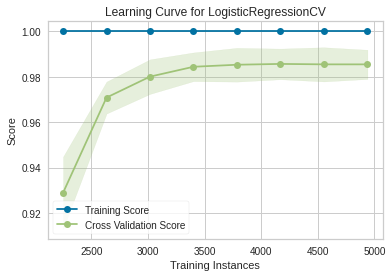

In [ ]:
ProjectFunctions.learning_curve(pos_modeling_2, X_2, y_2)

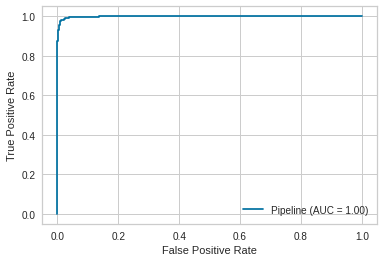

In [ ]:
metrics.plot_roc_curve(pos_modeling_2, X_test_pos_2, y_test_pos_2)

In [ ]:
ProjectFunctions.show_most_informative_features(pos_modeling_2['vectorizer'], pos_modeling_2['classifier'])

	-21.1040	covid          		21.9491	atualizado     
	-13.9851	vacina         		21.2955	fake           
	-13.2641	diminuir       		18.7916	deputar        
	-12.5774	colombia       		18.5396	compartilhar   
	-11.5524	distanciamento 		18.3724	segundar       
	-11.4035	legendar       		17.4463	ultima         
	-10.9290	descartar      		15.6157	falecer        
	-10.5511	whatsapp       		15.1303	evento         
	-10.4138	madri          		14.5337	proposto       
	-10.3081	isolamento     		14.5236	quartafeira    
	-10.2076	conteudos      		14.3126	entanto        
	-10.1358	espanha        		14.2349	vezar          
	-10.1289	oms            		14.0304	marcar         
	-9.6966	buzios         		13.9511	sextafeira     
	-9.3750	afirmacoes     		13.9332	atar           
	-9.2557	governador     		13.8163	comentarios    
	-9.0654	supostamente   		13.3343	medir          
	-8.9268	aliexpress     		13.3208	semana         
	-8.7953	espanhol       		13.2701	anunciar       
	-8.7629	mascara        		13.1990	ris

Vemos a incidência de dias da semana como feature para classificação.

In [ ]:
predict_explainer_for_training(875, pos_modeling_2, X_test_pos_2, y_test_pos_2,
                  train_2.classe, pred_tf_p_2, pred_prob_p_2)

Categoria: VERDADEIRO --> Predição: VERDADEIRO | Probabilidade: 100.0 %


Vamos ver seu comportamento em novos dados.

Vamos pensar em estratégias de balanceamento do dataset, já que nosso modelo está acertando muito mais notícias verdadeiras do que falsas. Vamos criar uma função somente para observar as métricas.

In [ ]:
# Regressãoogistica automaticamente balanceada
pos_modeling_balanced = pipeline.Pipeline([('vectorizer', TfidfVectorizer(stop_words=stop_port)),
                                  ('classifier', LogisticRegressionCV(cv=3,
                                                                      random_state=123,
                                                                      max_iter=1000,
                                                                      class_weight='balanced'))])

In [ ]:
ProjectFunctions.procurando_metricas(pos_modeling_balanced, train_2.noticia_lem, 
                    train_2.classe, X_test_pos_2, y_test_pos_2)

              precision    recall  f1-score   support

       FALSO      0.927     0.901     0.913       715
  VERDADEIRO      0.936     0.953     0.945      1096

    accuracy                          0.933      1811
   macro avg      0.931     0.927     0.929      1811
weighted avg      0.933     0.933     0.932      1811



Vemos que os resultados foram ligeiramente melhores, mas nada compensativo. Além disso, o F1-score é menor.

In [ ]:
pred_real = pos_modeling_balanced.predict(testagem.textos)
prob_real = pos_modeling_balanced.predict_proba(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_real, digits=3))

              precision    recall  f1-score   support

       FALSO      0.833     0.714     0.769        14
  VERDADEIRO      0.692     0.818     0.750        11

    accuracy                          0.760        25
   macro avg      0.763     0.766     0.760        25
weighted avg      0.771     0.760     0.761        25



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


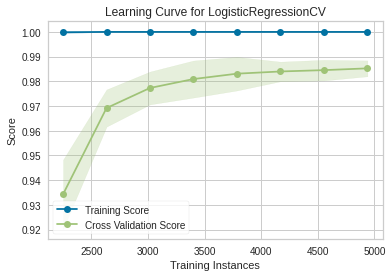

In [ ]:
ProjectFunctions.learning_curve(pos_modeling_balanced, X, y)

In [ ]:
# Regressãoogistica automaticamente balanceada
pos_modeling_balanced_2 = pipeline.Pipeline([('vectorizer', TfidfVectorizer(stop_words=stop_port)),
                                  ('classifier', LogisticRegressionCV(cv=3,
                                                                      random_state=123,
                                                                      max_iter=1000,
                                                                      class_weight={'FALSO':0.9,
                                                                                    'VERDADEIRO':0.1}))])

In [ ]:
true_f = train_2.loc[train_2.classe == 'VERDADEIRO'][:800]
false_f = train_2.loc[train_2.classe == 'FALSO']

train_2_fn = pd.concat([true_f, false_f], axis=0)

# Igualando o número de amostras de teste
test_2 = pd.concat([X_test_pos_2, y_test_pos_2], axis=1)
true = test_2.loc[test_2.classe == 'VERDADEIRO'][:715]
false = test_2.loc[test_2.classe == 'FALSO']

test_2_n = pd.concat([true, false], axis=0)

In [ ]:
ProjectFunctions.procurando_metricas(pos_modeling_balanced_2, train_2_fn.noticia_lem, train_2_fn.classe, test_2_n.noticia_lem, test_2_n.classe)

              precision    recall  f1-score   support

       FALSO      0.933     0.951     0.942       715
  VERDADEIRO      0.950     0.931     0.941       715

    accuracy                          0.941      1430
   macro avg      0.941     0.941     0.941      1430
weighted avg      0.941     0.941     0.941      1430



In [ ]:
pred_real = pos_modeling_balanced_2.predict(testagem.textos)
prob_real = pos_modeling_balanced_2.predict_proba(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_real, digits=3))

              precision    recall  f1-score   support

       FALSO      0.700     1.000     0.824        14
  VERDADEIRO      1.000     0.455     0.625        11

    accuracy                          0.760        25
   macro avg      0.850     0.727     0.724        25
weighted avg      0.832     0.760     0.736        25



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


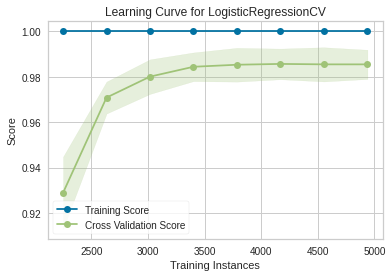

In [ ]:
ProjectFunctions.learning_curve(pos_modeling_2, X_2, y_2)

Mesmo com pesos totalmente diferenciados, as notícias verdadeiras ainda sim tem uma precisão maior, com mais acertos. Vamos balancear o dataset manualmente então.

In [ ]:
pos_modeling_3 = pipeline.Pipeline([('vectorizer', TfidfVectorizer(stop_words=stop_port)),
                                  ('classifier', LogisticRegressionCV(cv=3,
                                                                      random_state=123,
                                                                      max_iter=1000))])

In [ ]:
# Diminuindo o número de notícias verdadeiras.
train_3 = pd.concat([X_train_pos_2, y_train_pos_2], axis=1)
train_3.dropna(axis=0, inplace=True)

true_3 = train_3.loc[train_3.classe == 'VERDADEIRO'][:800]
false_3 = train_3.loc[train_3.classe == 'FALSO']

new_df_3 = pd.concat([true_3, false_3], axis=0, ignore_index=False)

In [ ]:
new_df_3.classe.value_counts()

FALSO         1069
VERDADEIRO     800
Name: classe, dtype: int64

In [ ]:
ProjectFunctions.procurando_metricas(pos_modeling_3, new_df_3.noticia_lem, new_df_3.classe, test_2_n.noticia_lem, test_2_n.classe)

              precision    recall  f1-score   support

       FALSO      0.946     0.924     0.935       715
  VERDADEIRO      0.926     0.947     0.936       715

    accuracy                          0.936      1430
   macro avg      0.936     0.936     0.936      1430
weighted avg      0.936     0.936     0.936      1430



In [ ]:
pred_real = pos_modeling_3.predict(testagem.textos)
prob_real = pos_modeling_3.predict_proba(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_real, digits=3))

              precision    recall  f1-score   support

       FALSO      0.765     0.929     0.839        14
  VERDADEIRO      0.875     0.636     0.737        11

    accuracy                          0.800        25
   macro avg      0.820     0.782     0.788        25
weighted avg      0.813     0.800     0.794        25



Vamos dificultar um pouco para nosso modelo e retirar algumas palavras que não tenham uma importância real para a classificação das notícias.

In [ ]:
pos_modeling_new = pipeline.Pipeline([('vectorizer', TfidfVectorizer(stop_words=stop_port)),
                                  ('classifier', LogisticRegressionCV(cv=3,
                                                                      random_state=123,
                                                                      max_iter=1000))])

In [ ]:
# Lista de palavras que serão retiradas
word_list = ['domingo', 'segundafeira', 'tercafeira', 'quartafeira',
             'quintafeira', 'sextafeira', 'rede', 'impressao',
             'sabado', 'atualizar', 'marcar', 'comentarios', 
             'camara', 'deputados', 'priscila', 'segundar', 'deputar',
             'compartilhar', 'atar', 'marcar', 'vezar', 'atualizado', 'entanto',
             'comentar', 'janeiro', 'fevereiro', 'marco', 'abril', 'maio',
             'junho', 'julho', 'agosto', 'setembro', 'outubro', 'novembro',
             'dezembro', 'roney', 'projeto', 'ultima', 'circular',
             'versao', 'madri', 'colombia']
  
repl_wrd = ''
  
# Criando função que retira múltiplas palavras de um dataset
def return_no_word(txt):
    res = re.sub("|".join(sorted(word_list, key = len, reverse = True)), repl_wrd, txt)
    return res

In [ ]:
X_n = df_lem.noticia_lem
y_n = df_lem.classe

# Repartindo o dataset em teste e treino
X_train_pos_new, X_test_pos_new, y_train_pos_new, y_test_pos_new = train_test_split(X_n, y_n, 
                                                    test_size=0.33,
                                                    random_state=123)

In [ ]:
new_test = X_train_pos_new.apply(return_no_word)

In [ ]:
# Retirando notícias com menos de 70 caracteres e truncando notícias
# com mais de 200 caracteres nos textos de treino
X_train_pos_new = new_test.apply(lambda x: np.nan if len(x) < 70 
                                         else x[:200])

train_n = pd.concat([X_train_pos_new, y_train_pos_new], axis=1)
train_n.dropna(axis=0, inplace=True)

In [ ]:
true_n = train_n.loc[train_n.classe == 'VERDADEIRO'][:800]
false_n = train_n.loc[train_n.classe == 'FALSO']

train = pd.concat([true_n, false_n], axis=0)

In [ ]:
# Vetorizando os datasets
train_pos_new = pos_modeling_new['vectorizer'].fit_transform(train.noticia_lem)
test_pos_new = pos_modeling_new['vectorizer'].transform(X_test_pos_new)

# Treinando e testando
pos_modeling_new['classifier'].fit(train_pos_new, train.classe)
pred_tf_p_n = pos_modeling_new['classifier'].predict(test_pos_new)

# Probabilidade das predições
pred_prob_p_n = pos_modeling_new['classifier'].predict_proba(test_pos_new)

In [ ]:
ProjectFunctions.procurando_metricas(pos_modeling_new, 
                                     train.noticia_lem, 
                                     train.classe, 
                                     X_test_pos_new, y_test_pos_new)

              precision    recall  f1-score   support

       FALSO      0.856     0.931     0.892       715
  VERDADEIRO      0.953     0.898     0.924      1096

    accuracy                          0.911      1811
   macro avg      0.904     0.915     0.908      1811
weighted avg      0.914     0.911     0.912      1811



In [ ]:
pred_real = pos_modeling_new.predict(testagem.textos)
prob_real = pos_modeling_new.predict_proba(testagem.textos)
print(metrics.classification_report(testagem.classe_original, pred_real, digits=3))

              precision    recall  f1-score   support

       FALSO      0.733     0.786     0.759        14
  VERDADEIRO      0.700     0.636     0.667        11

    accuracy                          0.720        25
   macro avg      0.717     0.711     0.713        25
weighted avg      0.719     0.720     0.718        25



In [ ]:
metrics.confusion_matrix(testagem.classe_original, pred_real)

array([[11,  3],
       [ 4,  7]])

In [ ]:
ProjectFunctions.show_most_informative_features(pos_modeling_new['vectorizer'],
                                                pos_modeling_new['classifier'])

	-6.3939	covid          		5.4400	lei            
	-4.2572	vacina         		2.6456	social         
	-3.1985	oms            		2.6174	medir          
	-2.8371	morte          		2.5376	proposto       
	-2.6110	governador     		2.3815	cbn            
	-2.4390	espanha        		2.2372	informar       
	-2.4216	mascara        		2.1780	pennafort      
	-2.0611	umar           		2.0658	fake           
	-2.0191	prefeito       		2.0552	publicacoes    
	-1.9288	recomendar     		2.0166	ala            
	-1.8729	chines         		1.9764	riscar         
	-1.8636	isolamento     		1.9709	buscar         
	-1.8135	legendar       		1.9392	anunciar       
	-1.7986	causar         		1.9225	caso           
	-1.7960	diminuir       		1.8558	combater       
	-1.7738	hospital       		1.8358	diagnosticar   
	-1.7321	whatsapp       		1.8222	roberto        
	-1.7276	argentino      		1.8189	evento         
	-1.7229	policiar       		1.8177	destacar       
	-1.7206	emergencia     		1.8126	apresentar     


# Métricas Gerais

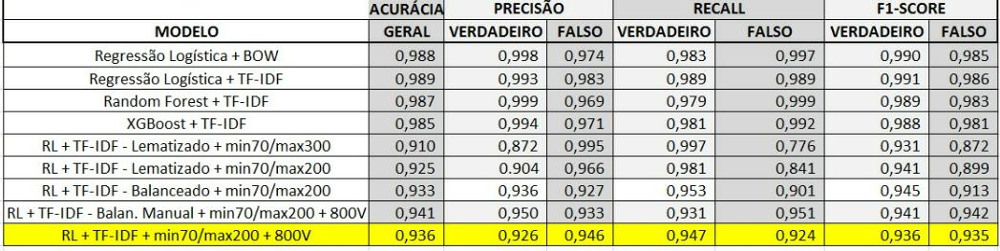